In [1]:
import os
import random
import torch
from torch import nn
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from torchvision.datasets import ImageFolder
import torch.optim as optim
from matplotlib import pyplot as plt
import pandas as pd
import numpy as np
from torch.utils.tensorboard import SummaryWriter
from datetime import datetime
from tqdm import tqdm
import seaborn as sns

/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


In [2]:
path = "/kaggle/input/paddydoctor/"

In [3]:
IMG_SIZE = (384, 384)

In [4]:
transform = transforms.Compose([
    transforms.Resize(IMG_SIZE,antialias=True),
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.45, 0.43, 0.40], std=[0.24, 0.24, 0.24]),
])

In [5]:
dataset = ImageFolder(path,transform)

In [6]:
diseases = dataset.classes
diseases

['bacterial_leaf_blight',
 'bacterial_leaf_streak',
 'bacterial_panicle_blight',
 'black_stem_borer',
 'blast',
 'brown_spot',
 'downy_mildew',
 'hispa',
 'leaf_roller',
 'normal',
 'tungro',
 'white_stem_borer',
 'yellow_stem_borer']

In [7]:
def show_random(samples_per_class):
    for cls in diseases:
      imgs = os.listdir(path+cls)
      samples = random.sample(imgs,samples_per_class)
      # Read images as arrays
      images = [np.pad(plt.imread(f"{path}{cls}/{img_path}"), ((0, 0), (12, 12), (0, 0))) for img_path in samples]

      # Concatenate images horizontally
      concatenated_image = np.concatenate(images, axis=1)
      plt.figure(figsize=(12,10))
      plt.imshow(concatenated_image)
      plt.title("Disease: "+cls)
      plt.axis("off")
      plt.show()

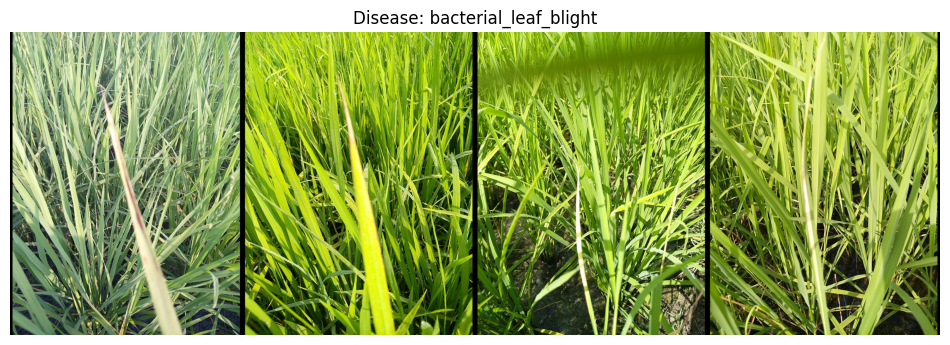

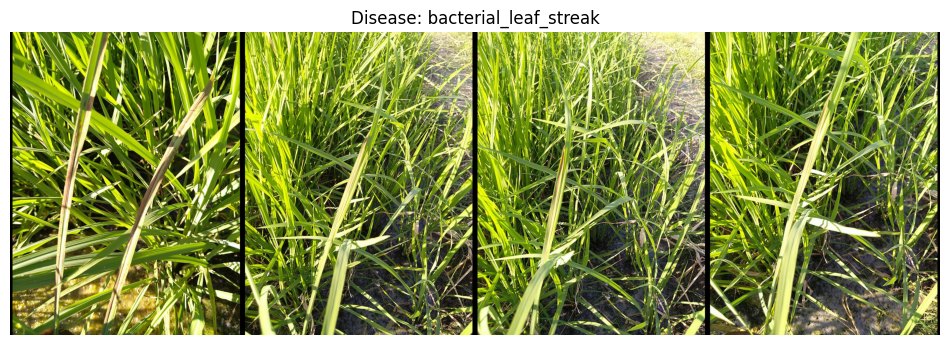

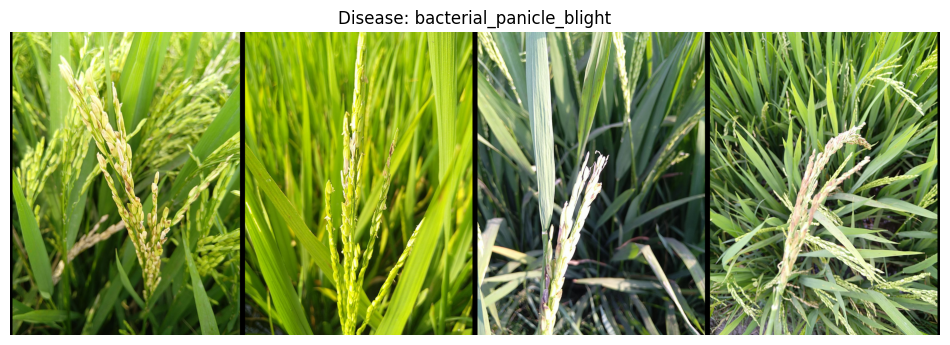

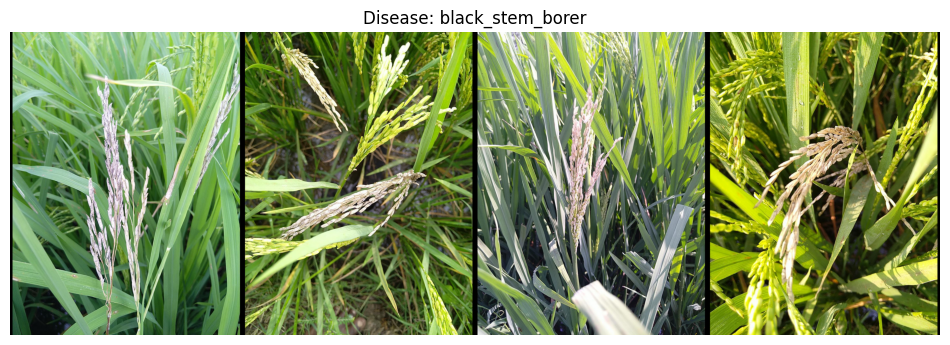

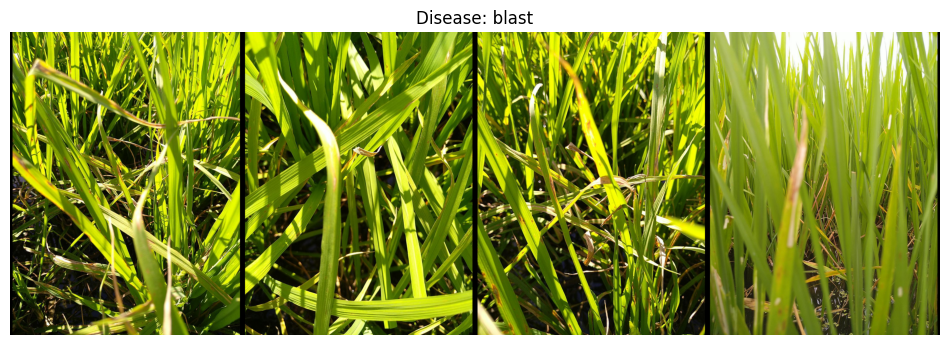

...

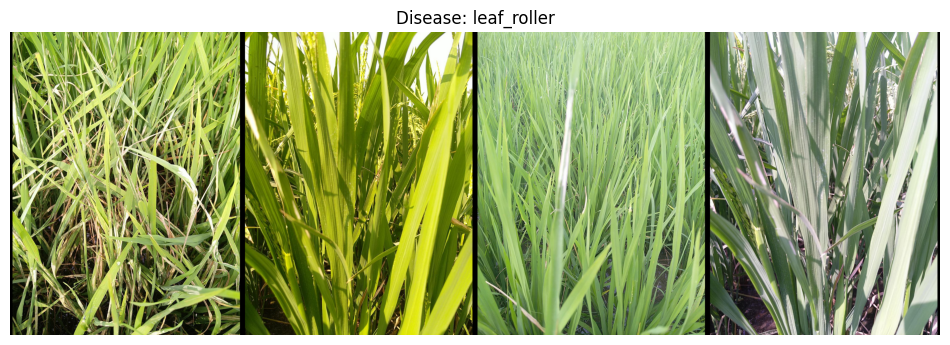

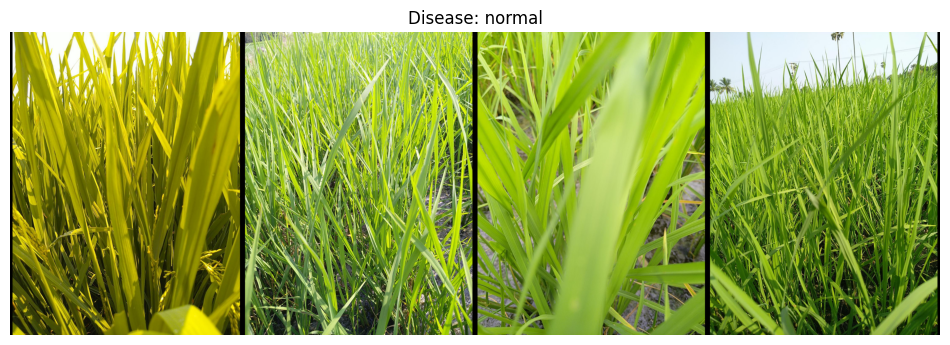

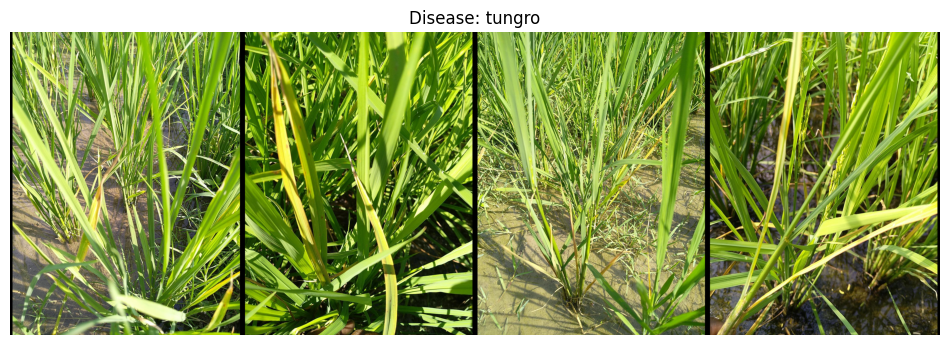

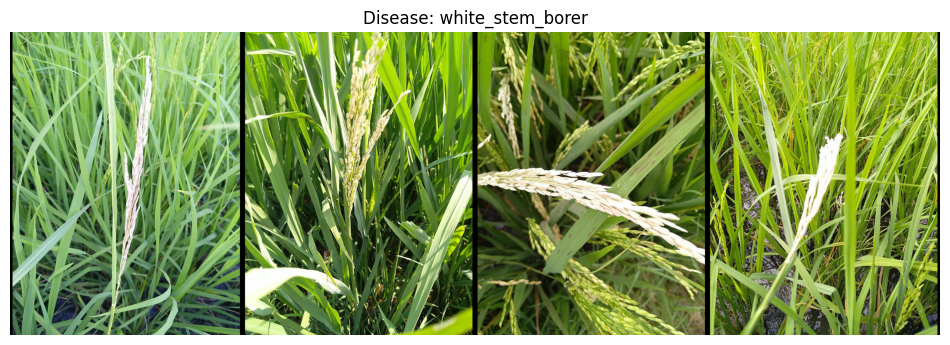

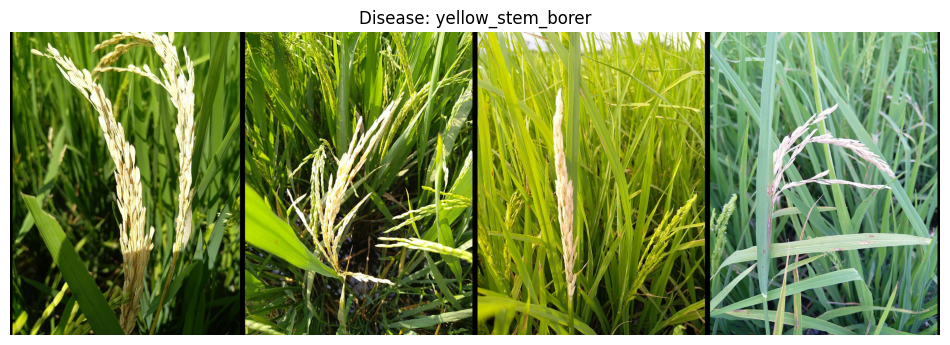

In [8]:
show_random(4)

In [9]:
train_dataset, val_dataset = torch.utils.data.random_split(dataset, [0.8, 0.2])

In [10]:
BATCH_SIZE = 32

In [11]:
import gc
gc.collect()

19955

In [12]:
train_loader =  DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader =  DataLoader(val_dataset, batch_size=BATCH_SIZE)

In [13]:
model = models.vit_b_16("ViT_B_16_Weights.IMAGENET1K_SWAG_E2E_V1", progress=True)
model = model.eval()

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:135: UserWarning: Using 'weights' as positional parameter(s) is deprecated since 0.13 and may be removed in the future. Please use keyword parameter(s) instead.
  warnings.warn(
Downloading: "https://download.pytorch.org/models/vit_b_16_swag-9ac1b537.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16_swag-9ac1b537.pth
100%|██████████| 331M/331M [00:12<00:00, 27.4MB/s]


In [14]:
num_ftrs = model.heads.head.in_features
num_ftrs

768

In [15]:
model.heads.head = nn.Linear(num_ftrs,len(diseases))

In [16]:
model.load_state_dict(torch.load("/kaggle/input/paddy-midterm-vit/paddy_ViT-30epochs.pt"))

<All keys matched successfully>

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [18]:
def train(model,EPOCHS,train_loader,val_loader, lr = 0.001,exp_name=""):
    writer = SummaryWriter(f"runs/{exp_name}")

    batch_n = len(train_loader)

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)
    model = model.to(device)

    train_acc = []
    train_loss = []
    val_loss = [99]
    val_acc = [0]

    for epoch in range(EPOCHS):
        model.train(True)
        pbar = tqdm(train_loader)

        batch_loss = []
        batch_acc = []

        for i,data in enumerate(pbar):
            inputs,labels = data
            inputs = inputs.to(device)
            labels = labels.to(device)

            optimizer.zero_grad()

            # Make predictions for this batch
            outputs = model(inputs)
            acc = (labels == outputs.argmax(dim=-1)).float().mean().item()
            # Compute the loss and its gradients
            loss = criterion(outputs, labels)
            loss.backward()

            batch_loss.append(loss.item())
            batch_acc.append(acc)
            # Adjust learning weights
            optimizer.step()

            pbar.set_description(f"Epoch: {epoch + 1}/{EPOCHS}; Train Loss: {round(np.mean(batch_loss),3)}; Train Acc: {round(np.mean(batch_acc),3)};\
            Val Loss: {round(np.mean(val_loss),3)}; Val Acc: {round(np.mean(val_acc),3)}")

          # Set the model to evaluation mode, disabling dropout and using population
          # statistics for batch normalization.
        model.eval()
        # Disable gradient computation and reduce memory consumption.
        with torch.no_grad():
            val_batch_loss = []
            val_batch_acc = []
            for i, vdata in enumerate(val_loader):
                vinputs, vlabels = vdata
                vinputs = vinputs.to(device)
                vlabels = vlabels.to(device)
                voutputs = model(vinputs)
                test_acc = (vlabels == voutputs.argmax(dim=-1)).float().mean().item()
                vloss = criterion(voutputs, vlabels).item()

                val_batch_loss.append(vloss)
                val_batch_acc.append(test_acc)

        val_loss.append(np.mean(val_batch_loss))
        val_acc.append(np.mean(val_batch_acc))
        train_acc.append(np.mean(batch_acc))
        train_loss.append(np.mean(batch_loss))

        writer.add_scalars(exp_name+"/Train vs Val/loss", {"train":train_loss[-1],"val":val_loss[-1]}, epoch)
        writer.add_scalars(exp_name+"/Train vs Val/accuracy", {"train":train_acc[-1],"val":val_acc[-1]}, epoch)


    writer.add_hparams({"lr":0.001,"batch_size":BATCH_SIZE},
     {"train_loss":train_loss[-1],"val_loss":val_loss[-1],"train_acc":train_acc[-1],"val_acc":val_acc[-1]})
    return train_acc,train_loss,val_acc,val_loss

In [19]:
EPOCHS = 30

In [20]:
EXP_NAME = "Resnet50-imgnet-ViT"

In [21]:
train_acc,train_loss,val_acc,val_loss = train(model,EPOCHS,train_loader,val_loader,lr=1e-4,exp_name=EXP_NAME)

Epoch: 1/30; Train Loss: 0.038; Train Acc: 0.989;            Val Loss: 99.0; Val Acc: 0.0: 100%|██████████| 406/406 [19:57<00:00,  2.95s/it]
Epoch: 2/30; Train Loss: 0.022; Train Acc: 0.993;            Val Loss: 49.518; Val Acc: 0.495: 100%|██████████| 406/406 [18:47<00:00,  2.78s/it]
Epoch: 3/30; Train Loss: 0.021; Train Acc: 0.994;            Val Loss: 33.024; Val Acc: 0.659: 100%|██████████| 406/406 [18:50<00:00,  2.78s/it]
Epoch: 4/30; Train Loss: 0.03; Train Acc: 0.991;            Val Loss: 24.777; Val Acc: 0.742: 100%|██████████| 406/406 [18:48<00:00,  2.78s/it]
Epoch: 5/30; Train Loss: 0.019; Train Acc: 0.994;            Val Loss: 19.832; Val Acc: 0.791: 100%|██████████| 406/406 [18:50<00:00,  2.78s/it]
Epoch: 6/30; Train Loss: 0.013; Train Acc: 0.996;            Val Loss: 16.533; Val Acc: 0.824: 100%|██████████| 406/406 [18:42<00:00,  2.77s/it]
Epoch: 7/30; Train Loss: 0.036; Train Acc: 0.987;            Val Loss: 14.179; Val Acc: 0.847: 100%|██████████| 406/406 [18:44<00:00,  

In [22]:
torch.save(model.state_dict(), "paddy_ViT-30epochs.pt") 

In [23]:
from sklearn.metrics import classification_report,accuracy_score,confusion_matrix, ConfusionMatrixDisplay, precision_score, recall_score, f1_score

In [24]:
# model.load_state_dict(torch.load("/kaggle/input/paddy-midterm/paddy_resnet50-30epochs_pre.pt"))

In [25]:
def evaluate_model(model,data_loader,ds=""):
    # we can now evaluate the network on the test set
    print(f"[INFO] evaluating network on {ds} set...")
    # turn off autograd for testing evaluation
    criterion = nn.CrossEntropyLoss()
    with torch.no_grad():
        # set the model in evaluation mode
        model.eval()

        # initialize a list to store our predictions
        preds = []
        true = []
        loss = 0
        # loop over the test set
        pbar = tqdm(data_loader)
        for (x, y) in pbar:
            # send the input to the device
            x = x.to(device)
            # make the predictions and add them to the list
            true.extend(y.cpu().tolist())
            pred = model(x)
            preds.extend(pred.argmax(axis=1).cpu().tolist())
            loss = criterion(pred, y.to(device))
        
#         loss/=len(pbar)

    # generate a classification report
    print(classification_report(true,
        preds, target_names=diseases))
    print(f"{ds} Accuracy: ",accuracy_score(true,preds))
    print(f"{ds} Precision: ",precision_score(true,preds, average="weighted"))
    print(f"{ds} Recall: ",recall_score(true,preds,average="weighted"))
    print(f"{ds} F1: ",f1_score(true,preds,average="weighted"))
    print(f"{ds} Loss: ",loss)
    return true,preds

    # plt.rcParams.update({'font.size': 8})
    # cm = confusion_matrix(true, preds)
    # ax = plt.subplot()
    # sns.heatmap(cm,annot=True,fmt="g")
    # ax.set_xlabel('Predicted labels')
    # ax.set_ylabel('True labels')
    # ax.set_title(f'Confusion Matrix-{ds} Set',fontsize=10)
    # ax.xaxis.set_ticklabels(diseases,rotation=90,fontsize=7)
    # ax.yaxis.set_ticklabels(diseases,rotation=0,fontsize=7)
    # plt.show()

In [26]:
oo1 = evaluate_model(model,train_loader,ds="train")

[INFO] evaluating network on train set...


100%|██████████| 406/406 [08:28<00:00,  1.25s/it]


                          precision    recall  f1-score   support

   bacterial_leaf_blight       1.00      1.00      1.00       505
   bacterial_leaf_streak       1.00      1.00      1.00       411
bacterial_panicle_blight       1.00      1.00      1.00       357
        black_stem_borer       1.00      1.00      1.00       410
                   blast       1.00      1.00      1.00      1927
              brown_spot       1.00      1.00      1.00      1016
            downy_mildew       1.00      1.00      1.00       701
                   hispa       1.00      1.00      1.00      1710
             leaf_roller       1.00      1.00      1.00       871
                  normal       1.00      1.00      1.00      1897
                  tungro       1.00      1.00      1.00      1570
        white_stem_borer       1.00      1.00      1.00      1015
       yellow_stem_borer       1.00      1.00      1.00       590

                accuracy                           1.00     12980
        

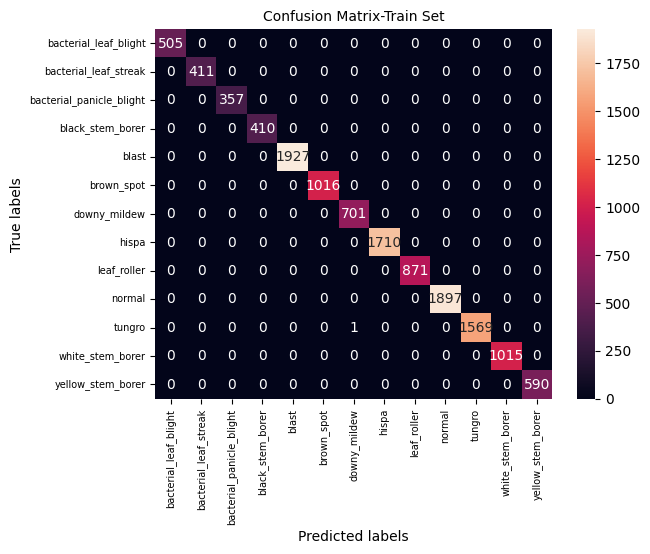

In [27]:
cm = confusion_matrix(oo1[0], oo1[1])
ax = plt.subplot()
sns.heatmap(cm,annot=True,fmt="g")
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix-Train Set',fontsize=10)
ax.xaxis.set_ticklabels(diseases,rotation=90,fontsize=7)
ax.yaxis.set_ticklabels(diseases,rotation=0,fontsize=7)

plt.show()

In [28]:
model = model.cuda()

In [29]:
oo2 = evaluate_model(model,val_loader,ds="Validation")

[INFO] evaluating network on Validation set...


100%|██████████| 102/102 [02:07<00:00,  1.25s/it]

                          precision    recall  f1-score   support

   bacterial_leaf_blight       1.00      1.00      1.00       143
   bacterial_leaf_streak       1.00      1.00      1.00        94
bacterial_panicle_blight       1.00      1.00      1.00        93
        black_stem_borer       0.99      0.98      0.98        96
                   blast       0.99      1.00      0.99       424
              brown_spot       0.99      1.00      1.00       241
            downy_mildew       0.98      0.97      0.98       167
                   hispa       1.00      0.99      0.99       441
             leaf_roller       1.00      0.99      0.99       224
                  normal       0.99      1.00      0.99       508
                  tungro       1.00      0.99      1.00       381
        white_stem_borer       0.99      1.00      0.99       258
       yellow_stem_borer       1.00      1.00      1.00       175

                accuracy                           0.99      3245
        

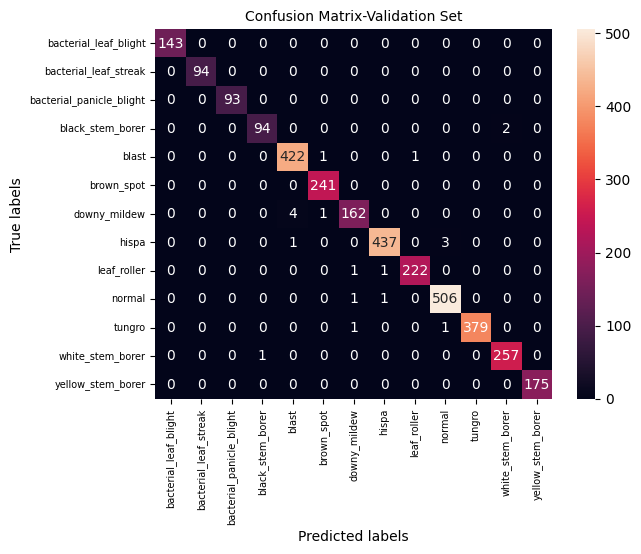

In [30]:
cm = confusion_matrix(oo2[0], oo2[1])
ax = plt.subplot()
sns.heatmap(cm,annot=True,fmt="g")
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix-Validation Set',fontsize=10)
ax.xaxis.set_ticklabels(diseases,rotation=90,fontsize=7)
ax.yaxis.set_ticklabels(diseases,rotation=0,fontsize=7)

plt.show()

In [31]:
from torchvision.io import read_image

In [32]:
transform2 = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize(IMG_SIZE,antialias=True),
    transforms.ToTensor(),
    # transforms.Normalize(mean=[0.45, 0.43, 0.40], std=[0.24, 0.24, 0.24]),
])

In [33]:
def myPred(path):
    im = read_image(path)
    im = transform2(im).unsqueeze(0).cuda()
    pred = model(im)
    dis = diseases[pred.argmax().tolist()]
    print(dis)

In [34]:
!wget https://guardian.ng/wp-content/uploads/2019/06/Rice-Blast.jpg -O blast.jpg

--2024-01-06 00:02:29--  https://guardian.ng/wp-content/uploads/2019/06/Rice-Blast.jpg
Resolving guardian.ng (guardian.ng)... 141.193.213.11, 141.193.213.10
Connecting to guardian.ng (guardian.ng)|141.193.213.11|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 198909 (194K) [image/jpeg]
Saving to: ‘blast.jpg’

blast.jpg           100%[===================>] 194.25K  --.-KB/s    in 0.07s   

2024-01-06 00:02:29 (2.55 MB/s) - ‘blast.jpg’ saved [198909/198909]



In [35]:
myPred("blast.jpg")

brown_spot


In [36]:
myPred(path+"/brown_spot/PDD04463.jpg")

brown_spot


In [37]:
!wget https://as2.ftcdn.net/v2/jpg/04/12/82/89/1000_F_412828920_RfWxhgn00dXmnssHeFD6rvLcNbRatszA.jpg -O bs.jpg -q

In [38]:
myPred("bs.jpg")

brown_spot


In [39]:
%load_ext tensorboard
%tensorboard --logdir runs